In [ ]:
# MIT License
#
#@title Copyright (c) 2023 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# CCAI Tutorial on flood CCAI Tutorial on flood monitoring Part II: Water
Authors:
*   Casper Fibaek, [ESA Φ-lab](https://philab.esa.int/), Casper.Fibaek@esa.int
*   Andreas Luyts, [ESA Φ-lab](https://philab.esa.int/), Andreas.Luyts@ext.esa.int


**Prerequisites**:
1.   Basic understanding of Deep Learning and Remote Sensing.
2.   Familiarity with Python and geospatial data processing.

**Software requirements**:

We are going to use Google Colab. Some cloud storage is necessary to load the imagery.

**Goals**

* The purpose of this tutorial is to give an introduction to the use of Convolutional Neural Networks and Satellite Images for the climate science.
* The data will not be polished RGB data, which is often what is used in AI tutorials, but real satellite data that comes in with higher dimensions and modalities. The tutorial will introduce these datasets and showcase how they can be used to map structures and surface water in a simple way.

# Table of Contents


*   [Overview](#overview)
*   [Climate Impact](#climate-impact)
*   [Target Audience](#target-audience)
*   [Background & Prerequisites](#background-and-prereqs)
*   [Software Requirements](#software-requirements)
*   [Data Description](#data-description)
*   [Methodology](#methodology)
*   [Results & Discussion](#results-and-discussion)
*   [References](#references)


<a name="overview"></a>
# Overview

This notebook is Part II of the tutorial on flood monitoring. All  necessary background has been given in Part I. In Part I, a convolutional neural net was trained with labeled data to predict the building density based on hyperspectral data from Sentinel-2. This allows to estimate which regions are very densely populated and could be at risk in flooding events.

In the part II we will explore how to detect the extent of a potential flooding event. Since flooding events usually go paired with very bad and cloudy weather, Sentinel-2 data can not be used as optical data is blocked by the clouds. SAR is however not limited by this and can penetrate the cloud cover to monitor surface water. We will explore mapping water using an index based approach for Sentinel 2. Using this water index (NDWI) , we will train a Convolutional Neural Network to estimate water using Sentinel 1.

<a name="software-requirements"></a>
# Software Requirements

On Colab, make sure to **enable a GPU runtime** (should be automatically, otherwise go to 'Runtime' in the upper taskbar and select 'change runtime type'. With a GPU the models will train much faster and their will be more RAM available for processing.
The Python version at the time of this submission in Colab = Python 3.10.11.

**The tools.**

* PyTorch
* Numpy
* Matplotlib
* Buteo

Google Colab comes preinstalled with PyTorch and NumPy and matplotlib, so we only need to install buteo.

**Buteo** is a toolbox designed to simplify the process of working with geospatial data in machine learning. It includes tools for reading, writing, and processing geospatial data, as well as tools for creating labels from vector data and generating patches from geospatial data. Buteo makes it easy to ingest data, create training data, and perform inference on geospatial data.<br>
[Documentation](https://casperfibaek.github.io/buteo/buteo.html)

In [ ]:
# Install buteo
!pip install buteo==0.9.15 --upgrade -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 48.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 MB 15.3 MB/s eta 0:00:00


In [ ]:
import buteo as beo
import numpy as np
import torch
import os

In [ ]:
#@title Utility functions
# Lets see what the data looks like! These functions are just for printing
# in colab. You can safely ignore
import matplotlib
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import pyplot as plt
from collections.abc import Iterable

# Reset Matplotlib parameters to their default values
matplotlib.rcdefaults()

# Lets set some default pyplot parameters to make our plots look pretty.
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (16, 12)
plt.rcParams['figure.subplot.wspace'] = 0.05
plt.rcParams['image.interpolation'] = 'bilinear'


# Custom function for creating subplots with a specified face color
def custom_subplots(*args, facecolor="#FFFFFFFF", size=None, **kwargs):
    fig, axes = plt.subplots(*args, **kwargs)

    if size is not None:
        fig.set_size_inches(size[0], size[1])

    # Make sure axes is a list of axes objects
    if not isinstance(axes, Iterable) or isinstance(axes, np.ndarray) and axes.ndim == 0:
        axes = [axes]

    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

        for spine in ax.spines.values():
            spine.set_edgecolor('black')
            spine.set_linewidth(1)

    # Reduce the distance between the plotted images in the width
    plt.subplots_adjust(wspace=0.05)

    # Change the background color of the whole plot to grey
    fig.set_facecolor(facecolor)  # RGBA tuple for grey, 100% transparent if supported

    axes = axes[0] if len(axes) == 1 else axes

    return fig, axes


def clip_to_quantiles(arr, q_min=0.02, q_max=0.98):
    return np.clip(arr,
        np.nanquantile(arr, q_min),
        np.nanquantile(arr, q_max),
    )

def render_s2_as_rgb(arr):
    # If there are nodata values, lets cast them to zero.
    if np.ma.isMaskedArray(arr):
        arr = np.ma.getdata(arr.filled(0))

    # Select only Blue, green, and red.
    rgb_slice = arr[:, :, 0:3]

    # Clip the data to the quantiles, so the RGB render is not stretched to outliers,
    # Which produces dark images.
    for c in [0, 1, 2]:
        rgb_slice[:, :, c] = clip_to_quantiles(rgb_slice[:, :, c])

    # The current slice is uint16, but we want an uint8 RGB render.
    # We normalise the layer by dividing with the maximum value in the image.
    # Then we multiply it by 255 (the max of uint8) to be in the normal RGB range.
    for c in [0, 1, 2]:
        amax = np.amax(rgb_slice[:, :, c])
        rgb_slice[:, :, c] = (rgb_slice[:, :, c] / amax) * 255.0

    # We then round to the nearest integer and cast it to uint8.
    rgb_slice = np.rint(rgb_slice).astype(np.uint8)

    return rgb_slice


def render_s1_as_rgb(arr):
    # If there are nodata values, lets cast them to zero.
    if np.ma.isMaskedArray(arr):
        arr = np.ma.getdata(arr.filled(0))

    output = np.zeros((arr.shape[0], arr.shape[1], 3), dtype=np.float32)

    # Clip to quantiles
    for c in [0, 1]:
        output[:, :, c] = clip_to_quantiles(arr[:, :, c])

    # Normalise the results
    np.divide(
        output[:, :, 0],
        output[:, :, 1],
        out=output[:, :, 2],
        where=output[:, :, 1] != 0,
    )

    # Fit in 8bit and round
    for c in [0, 1, 2]:
        output[:, :, c] = (output[:, :, c] / np.amax(output[:, :, c])) * 255.0

    output = np.rint(output).astype(np.uint8)

    return output


# Predict function to go from numpy array to predictions.
def predict_numpy_arr(arr):
    swap = beo.channel_last_to_first(arr)
    as_torch = torch.from_numpy(swap).float()
    on_device = as_torch.to(device)
    predicted = model(on_device)
    on_cpu = predicted.cpu()
    as_numpy = on_cpu.numpy()
    swap_back = beo.channel_first_to_last(as_numpy)

    return swap_back

# Download data

There is quite a lot of data and we provide 2 ways to access it. Please try the option through Drive first. It should be the fastest and easiest option.

## Through Drive

**You may skip these 3 steps if you did this already in part I** <br><br>
To access the data through google drive follow the following steps:

1. Open the following link: https://drive.google.com/drive/folders/1j2KfDKLoy0Z0ngmnStZs14zj2KV9Pgju?usp=drive_link
2. Click on 'CCAI_FLOODS_TUTORIAL_DATA' in the header and choose 'Organize' --> 'Add shortcut'
3. Out of the listed options add to 'My Drive'

In [ ]:
# Lets load the project data from Google Drive.
from google.colab import drive
drive.mount('/content/drive')

FOLDER = '/content/drive/MyDrive/CCAI_FLOODS_TUTORIAL_DATA/'
FOLDER_PRED = '/content/drive/MyDrive/CCAI_FLOODS_TUTORIAL_PREDICTIONS/'

os.makedirs(FOLDER_PRED, exist_ok=True)

Mounted at /content/drive


In [ ]:
import zipfile
import tempfile
import os

# Create a temporary folder. This is deleted when the Colab Runtime exits.
temp_folder = tempfile.mkdtemp()

# Specify the path to the zip file in your Google Drive.
zip_file_path = os.path.join(FOLDER, "patches_middle-east.zip")

# Unzip the file to the temporary folder
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(temp_folder)

print(f"Zip file {zip_file_path} has been extracted to {temp_folder}")
print(sorted(os.listdir(temp_folder)))

Zip file /content/drive/MyDrive/CCAI_FLOODS_TUTORIAL_DATA/patches_middle-east.zip has been extracted to /tmp/tmp2pnjwryn
['dem_0.tif', 'dem_1.tif', 'dem_10.tif', 'dem_11.tif', 'dem_12.tif', 'dem_13.tif', 'dem_14.tif', 'dem_15.tif', 'dem_16.tif', 'dem_17.tif', 'dem_18.tif', 'dem_19.tif', 'dem_2.tif', 'dem_20.tif', 'dem_21.tif', 'dem_22.tif', 'dem_23.tif', 'dem_24.tif', 'dem_25.tif', 'dem_26.tif', 'dem_27.tif', 'dem_28.tif', 'dem_29.tif', 'dem_3.tif', 'dem_30.tif', 'dem_31.tif', 'dem_32.tif', 'dem_33.tif', 'dem_34.tif', 'dem_35.tif', 'dem_36.tif', 'dem_37.tif', 'dem_38.tif', 'dem_39.tif', 'dem_4.tif', 'dem_40.tif', 'dem_41.tif', 'dem_42.tif', 'dem_43.tif', 'dem_44.tif', 'dem_45.tif', 'dem_46.tif', 'dem_47.tif', 'dem_48.tif', 'dem_49.tif', 'dem_5.tif', 'dem_50.tif', 'dem_51.tif', 'dem_52.tif', 'dem_53.tif', 'dem_54.tif', 'dem_55.tif', 'dem_56.tif', 'dem_57.tif', 'dem_58.tif', 'dem_59.tif', 'dem_6.tif', 'dem_60.tif', 'dem_61.tif', 'dem_62.tif', 'dem_63.tif', 'dem_64.tif', 'dem_65.tif', 'de

## From Zenodo (backup option)


In [ ]:
#!wget -O Alexandria_S12DEM.zip -https://zenodo.org/record/7937444/files/Alexandria_S12DEM.zip


In [ ]:
# import zipfile
# import tempfile
# import os

# FOLDER = 'Alexandria_S12DEM'
# FOLDER_PRED = 'Alexandria_S12DEM_PREDICTIONS'
# os.makedirs(FOLDER_PRED, exist_ok=True)


# # Unzip the downloaded file
# with zipfile.ZipFile('Alexandria_S12DEM.zip', 'r') as zip_ref:
#     zip_ref.extractall()


# # Create a temporary folder
# temp_folder = os.path.join(FOLDER,'patches')

# print(f"Available patches at  {temp_folder}")
# print(sorted(os.listdir(temp_folder)))

<a name="data-description"></a>
# Data Description

For this part of the tutorial we will use Sentinel-1 and Sentinel-2 images from the region of Egypt. Detailed description of the data can be found in part I of the tutorial.


<a name="methodology"></a>
# Methodology

We are going to investigate flooding, water mapping, and population estimation using Sentinel 1, 2, and the CopDEM. The methodology will be kept simple, but there is room for data exploration and the full dataset for the mediterranean region of Egypt is available. The methods will be divided into three steps.

1. Estimation of population and structure density using a Convolutional Neural Network (Part I).
2. Mapping water using an index based approach for Sentinel 2 (Part II).
3. Using the water index (NDWI) from the previous step, we will train a Convolutional Neural Network to estimate water using Sentinel 1. This is highly useful in the case of flooding, which is usually accompanied by poor weather conditions, which make the use of spectral instruments impossible (Part II).

Let's start defining a few constants that we will need throughout this notebook.
Setting the SEED will make sure we get reproducible results every time we run the notebook.

In [ ]:
# ML training constants. Please explore adjusting these.
EPOCHS = 5
PATCH_SIZE = 32 # 32x32 pixels
BATCH_SIZE = 32 # 32 images per batch
OFFSETS = 1 # offset at (16, 16) effectively doubling the traning set.
LEARNING_RATE = 0.001

# Finding water
The next step in the analysis is to train a model that uses SAR data to find surface water. This is especially useful in flooding scenarios as the Sentinel 1 SAR instruments penetrate through clouds and allows us to see an accurate extent of flood scenarios.

But as was shown in the introduction, interpreting SAR data as RGB images and visually generating training data can be difficult. So we are going to use Sentinel 2 data captured at approximately the same time as Sentinel 1 data to generate training data.

## Normalized Difference Water Index (NDWI)


Instead of digitising labels for surface water ourselves, we are going to rely on Spectral Indicies.This means we are using ratios between different multispectral bands to derive information about water. In particular we are going to use NDWI (Normalized Difference Water Index), which is derived from the green and infrared band of the Sentinel 2 Satellite in the following fashion:

$$NDWI_a = \text{max}(0.0, \frac{Green-Nir}{Green+Nir})$$

The visible green wavelengths maximize the typical reflectance of the water surface. The near-infrared wavelengths maximize the high reflectance of terrestrial vegetation and soil features, while minimizing the low reflectance of water features. This means the result of the NDWI equation is positive values for water features and (close to) zero for soil and terrestrial vegetation.


In [ ]:
path_s1 = os.path.join(FOLDER, "S1.tif")
path_s2 = os.path.join(FOLDER, "S2.tif")

In [ ]:
# Loading the data can take 1-2 minutes depending on the speed of the colab instance you are allocated.

# The Sentinel 2 data is organised as follows:
# 0.Blue, 1.Green, 2.Red, 3.RedEdge1, 4.RedEdge2, 5.RedEdge3, 6.NIR, 7.SWIR1, 8.SWIR2
green = beo.raster_to_array(path_s2, bands=[2], filled=True, fill_value=0.0, cast=np.float32)
nir = beo.raster_to_array(path_s2, bands=[6], filled=True, fill_value=0.0, cast=np.float32)
rgb = beo.raster_to_array(path_s2, bands=[3, 2, 1], filled=True, fill_value=0) # Blue, Green, Red --> Red, Green, Blue

In [ ]:
# Calculate NDWI
ndwi_top = green - nir
ndwi_bot = green + nir
ndwi = np.zeros((green.shape[0], green.shape[1], 1), dtype=np.float32)
np.divide(ndwi_top, ndwi_bot, out=ndwi, where=ndwi_bot!=0)
np.clip(ndwi, 0.0, 1.0, out=ndwi)

# Clear memory.
del ndwi_top, ndwi_bot, green, nir

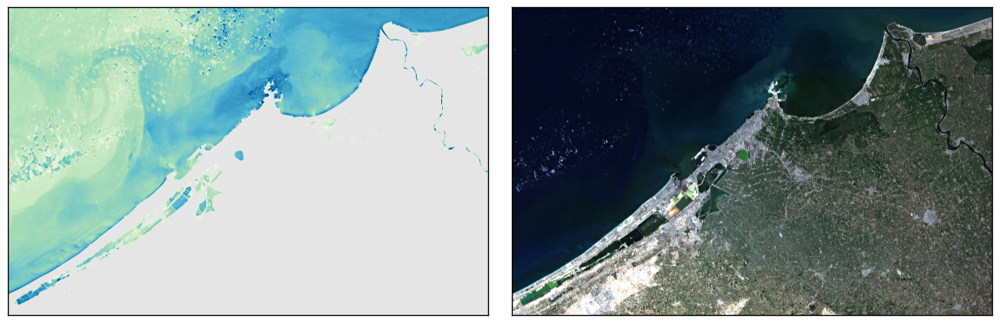

In [ ]:
fig, (ax1, ax2) = custom_subplots(nrows=1, ncols=2)

mask = (ndwi!=0)[:, :, 0].astype(np.float32)
ax1.imshow(ndwi, cmap="GnBu", vmin=0.0, vmax=1.0, alpha=mask)
ax2.imshow(render_s2_as_rgb(rgb))

plt.show()
fig.clf()

del mask

**Observe**: There are artifacts around the removed cloud in the ocean. What effect will this have on our model? Should we make efforts towards it and if so, what would you recommend?

## Inspect SAR data

Let's inspect the SAR data from Sentinel-1. There are  multiple ways to visualise SAR imagery. The most simple and straightforward is to simply plot the VV-compent or VH-compent. To capture more information encoded in the 2 SAR bands, one can also plot the SAR image as an RGB-images, in this case the 3 channels are (VV, VH, VV/VH)

*Check out `render_s1_as_rgb` in the utility functions to see how this is done.*

In [ ]:
# Takes approximiately 30s to load
s1_arr = beo.raster_to_array(path_s1, filled=True, fill_value=0.0, cast=np.float32)
s1_rgb = render_s1_as_rgb(s1_arr)

# Lets load the SAR data and normalise it while we are at it.
s1_arr, _statdict = beo.scaler_truncate(s1_arr, -35.0, 5)

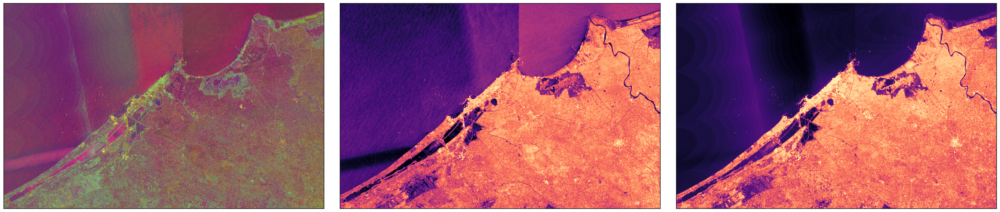

In [ ]:
fig, (ax1, ax2, ax3) = custom_subplots(ncols=3, nrows=1, size=(36, 12))
ax1.imshow(s1_rgb)

vv_norm = clip_to_quantiles(s1_arr[:, :, 0])
vh_norm = clip_to_quantiles(s1_arr[:, :, 1])
ax2.imshow(vv_norm, vmin=np.amin(vv_norm), vmax=np.amax(vv_norm), cmap="magma")
ax3.imshow(vh_norm, vmin=np.amin(vh_norm), vmax=np.amax(vh_norm), cmap="magma")

plt.show()
fig.clf()

del vv_norm, vh_norm, s1_rgb

## Prepare data and make train/val split

In [ ]:
# Lets generate some patches for a DL model.
patches_s1 = beo.array_to_patches(s1_arr, PATCH_SIZE, n_offsets=OFFSETS)
patches_ndwi = beo.array_to_patches(ndwi, PATCH_SIZE, n_offsets=OFFSETS)

x_train, x_val, y_train, y_val, = beo.split_train_val(patches_s1, patches_ndwi, val_size=0.1)

del s1_arr, ndwi, patches_s1, patches_ndwi

If you want to treat the problem as a binary classification set a threshold here. If you choose to do so, consider the implication of setting different threshold values. Example implementation:

```python
THRESHOLD = 0.01
y_train = (y_train > THRESHOLD).astype(np.float32)
y_val = (y_val > THRESHOLD).astype(np.float32)
```

*Don't worry if that does not make sense yet, it will later!*


Lets load the data into PyTorch. We use the beo dataset loaders, which allows us to add augmentations to the data. Here we use three augmentations:
1. rotation_xy (x_train and y_train)
2. mirror_xy (x_train and y_train)
3. cutmix (cutting and mixing images and labels)

Are there other augmentations that could be relevant to apply as well? What are the pro's and con's of applying augmentations?

In [ ]:
from torch.utils.data import DataLoader

# Ready the data for pytorch
def callback(x, y):
    return (
        torch.from_numpy(x).float(),
        torch.from_numpy(y).float(),
    )

# Create the dataset and DataLoader
dataset = beo.AugmentationDataset(
    x_train,
    y_train,
    callback=callback, # To turn the augmented numpy arrays into tensors
    input_is_channel_last=True,
    output_is_channel_last=False,
    augmentations=[
        { "name": "rotation_xy", "chance": 0.2 },
        { "name": "mirror_xy", "chance": 0.2 },
        { "name": "cutmix", "chance": 0.2 }
    ],
)
dataset_val = beo.Dataset(
    x_val,
    y_val,
    callback=callback, # To turn the augmented numpy arrays into tensors
    input_is_channel_last=True,
    output_is_channel_last=False,
)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
dataloader_val = DataLoader(dataset_val, batch_size=BATCH_SIZE, shuffle=False)

## Train Model

We will use the same simple model as before. Instead of 9 spectral bands from Sentinel-2, this time the model will take as input only 2 SAR bands. The output of the model is the Normalized Difference Water Index (NDWI).

In [ ]:
import torch.nn as nn

class SimpleConvNet(nn.Module):
    def __init__(self, in_channels, clamp_output=None):
        super(SimpleConvNet, self).__init__()
        self.clamp_output = True if clamp_output is not None else False

        if self.clamp_output:
            self.output_min = clamp_output[0]
            self.output_max = clamp_output[1]

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(128)
        )

        self.decoder = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 1, kernel_size=3, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)

        if self.clamp_output:
            x = torch.clamp(x, self.output_min, self.output_max)

        return x

In [ ]:
import torch.optim as optim
from torch.cuda.amp import GradScaler
import torch.nn.functional as F

# Create the model using the same simple ConvNet as before.
input_channels = 2 # Sentinel 1: VV, VH

# This time we know the output should be in [0.0, 1.0].
model = SimpleConvNet(input_channels, clamp_output=(0.0, 1.0))

# Our loss function. Currently MSE, if framed as a binary problem: Remember to change this.
criterion = torch.nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scaler = GradScaler()

# Move model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

SimpleConvNet(
  (encoder): Sequential(
    (0): Conv2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (decoder): Sequential(
    (0): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

This model uses Mean Squared Error loss. Can you think of other loss functions or maybe combination of loss functions that could produce more interesting results?

**Hint**: *What if we are mostly interested in the presence/non-presence of water and not so much the NDWI value itself? Try and write an implementation of a combined loss function.*

In [ ]:
# Lets train a new model!
from tqdm import tqdm

# Training loop
for epoch in range(EPOCHS):
    running_loss = 0.0

    # Customize the progress bar with colors and fixed width
    bar_format = '{l_bar}{bar:20}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}] {postfix}'

    # Initialize the progress bar for training
    train_pbar = tqdm(dataloader, total=len(dataloader), ncols=140, position=0, leave=True, bar_format=bar_format)

    for i, (inputs, targets) in enumerate(train_pbar):
        # Move inputs and targets to the device (GPU)
        inputs, targets = inputs.to(device), targets.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Cast to bfloat16
        with torch.autocast(device_type='cuda', dtype=torch.float16):

            # Forward pass
            outputs = model(inputs)

            # Compute loss
            loss = criterion(outputs, targets)

        # To avoid gradients either exploding or flushing to zero we use a gradient scaler.
        # If we were to use float32, instead of bfloat16, this would not be needed.
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # Print statistics
        current_loss = loss.item()
        running_loss += current_loss
        mean_loss = running_loss / (i + 1)

        # Update the training bar
        train_pbar.set_description(f"Epoch: {epoch+1:03d}/{EPOCHS:03d}")
        print_dict = { "loss": f"{mean_loss:6f}" }

        # At the end of the epoch, predict the validation set and inspect results
        if i == len(train_pbar) - 1:
            model.eval()  # Set model to evaluation mode

            running_loss = 0.0
            mean_loss = 0.0
            with torch.no_grad():
                for i, (x_val, y_val) in enumerate(dataloader_val):
                    inputs, targets = x_val.to(device), y_val.to(device)
                    outputs = model(inputs)
                    val_loss = criterion(outputs, targets)
                    running_loss += val_loss.item()
                    mean_loss = running_loss / (i + 1)

            print_dict["val_loss"] = f"{mean_loss:6f}"

            model.train()  # Set model back to training mode

        train_pbar.set_postfix(print_dict)

# You could save the model like this:
# torch.save(model.state_dict(), os.path.join(FOLDER_PRED, "example_model_water_01.pt"))

model.eval()
torch.cuda.empty_cache()

  0%|                    | 0/5205 [00:00<?, ?it/s] /usr/local/lib/python3.10/dist-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
Epoch: 005/005: 100%|████████████████████| 5205/5205 [01:13<00:00, 71.30it/s] , loss=0.008513, val_loss=0.009035


Currently we are only using the validation loss to visually inspect if our model is overfitting or underfitting. Can we automate this process? Ideas could also include ways for interactively adjusting the learning rate, batchsize, or stopping when it starts to overfit? Depending on the augmentation chosen, the model might underfit (Augmentation helps the model to generalise, but makes it more difficult to fit the training data). How could we more efficiently use the data augmentation steps?

# Results & discussion

As we did in part I, let's predict all of the Alexandria area and investigate the results. Again the results can be downloaded and be inspected in QGIS. Consider the impact of having both these datasets available for geospatial analysis.

**Mean, Median, Mad, Olympian?**
Predicting tiles using computer vision models are usually not consistent. Meaning that predicting a building that is in the center of a tile will usually be predicted with higher confidence than a pixel and the very edge of a tile. This is an issue, when every target pixel is of equal importance. To get around this we overlap the tiles and weigh border pixels differently. These predictions can be merged in multiple ways. Some popular ones are:

1. Weighted Mean: Weigh the pixels by distance to the edges and take the weigted average.
2. Olympian: Take the highest and lowest predictions away and calculate the weighted mean of the rest.
3. Weighted Median: Take the weighted median of the overlapping pixels weighted by distance to the edge. This is done by weighing the x-axis and doing a linear 2D interception of the central point. Usually the best compremise of speed and accuracy.
4. MAD matching. The is similar to median merging but more involved. You take the weighted median. Calculate the standard deviation around the median and then take the weighted median of the pixels within a window defined by a z-score. This is the best method - but is computationally intensive. In the last example we are going to use this method.

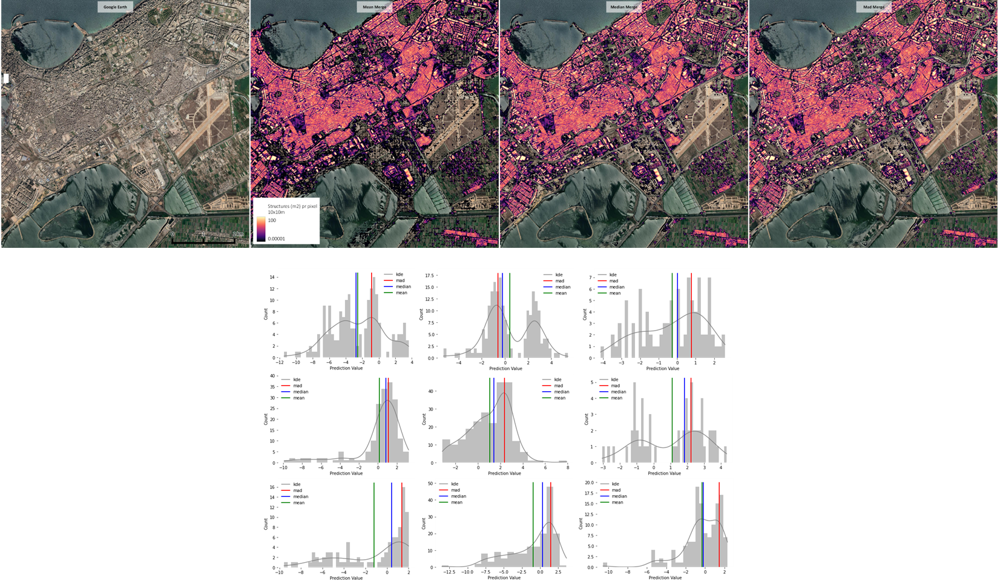

## Inspect predictions on all of Alexandria

Lets predict the whole scene and compare the results.

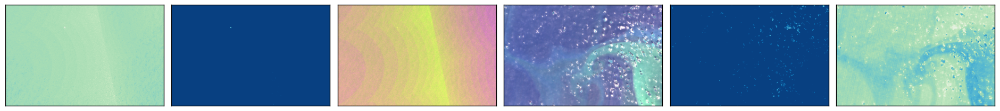

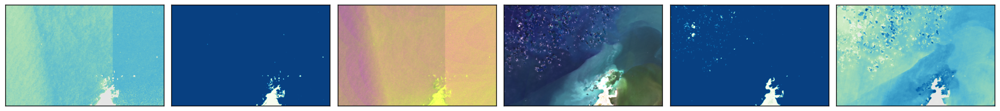

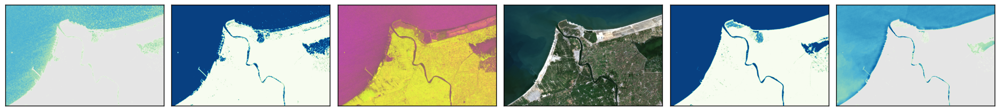

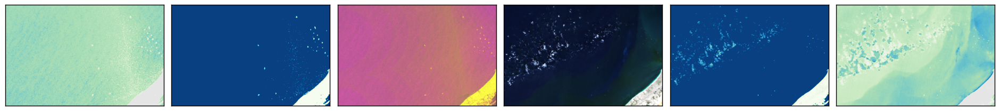

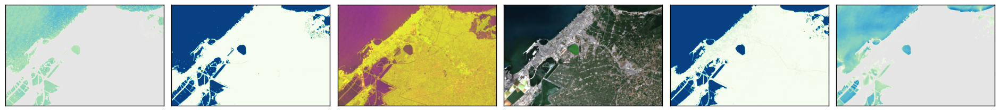

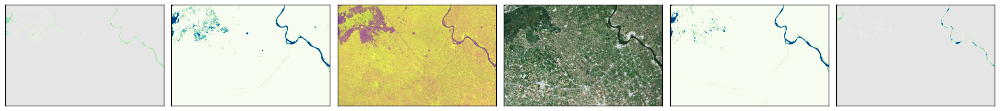

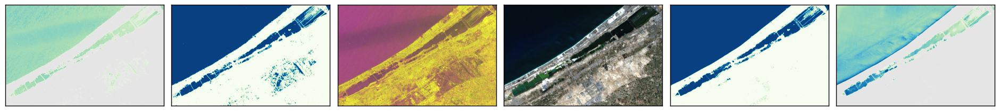

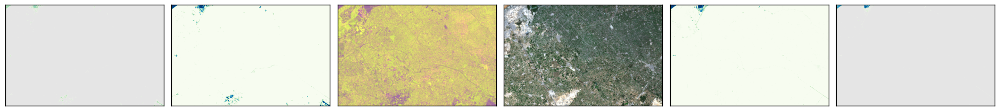

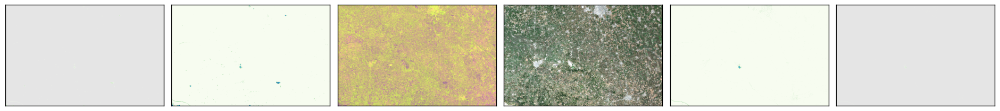

In [ ]:
# Lets predict the whole scene and compare the results.

# We read the whole alexandria scene in 9 chunks. We use the offset of the chunks to also
# sample the S2 data to calculate NDWI, and the RGB visualisation.
predicted_files = []
id = 0
for s1_arr, offset in beo.raster_to_array_chunks(path_s1, 9, filled=True, fill_value=0.0):

    # Read the data
    s1_arr, _statdict = beo.scaler_truncate(s1_arr, -35.0, 5)

    # Predict the data
    with torch.no_grad():
        predicted_ndwi = beo.predict_array(
            s1_arr,
            predict_numpy_arr, # <-- defined in the utility functions.
            tile_size=PATCH_SIZE,
            n_offsets=3,
            merge_method="mad",
        )

    # Save the prediction (Can be inspected in QGIS etc..)
    out_path = beo.array_to_raster(
        predicted_ndwi,
        reference=path_s1,
        out_path=os.path.join(FOLDER_PRED, f"prediction_{id}.tif"),
        pixel_offsets=offset,
    )
    id += 1
    predicted_files.append(out_path)

    # Visualise the results
    rgb = beo.raster_to_array(path_s2, bands=[3, 2, 1], pixel_offsets=offset, filled=True, fill_value=0.0)
    green = beo.raster_to_array(path_s2, bands=[2], pixel_offsets=offset, filled=True, fill_value=0.0, cast=np.float32)
    nir = beo.raster_to_array(path_s2, bands=[6], pixel_offsets=offset, filled=True, fill_value=0.0, cast=np.float32)
    ndwi = (green - nir) / (green + nir)
    ndwi, _statdict = beo.scaler_truncate(ndwi, 0.0, 1.0)

    # Lets mask anything above zero, as we are only interested in water.
    mask_ndwi = (predicted_ndwi > 0.0)[:, :, 0].astype(np.float32)
    mask = (ndwi != 0)[:, :, 0].astype(np.float32)

    # Lets create an example of what a binary models output might look like:
    THRESHOLD = 0.01 # At least 0.01 ndwi before being considered surface water.
    binary_pred = (predicted_ndwi > THRESHOLD)[:, :, 0].astype(np.float32)
    binary_true = (ndwi > THRESHOLD)[:, :, 0].astype(np.float32)

    # Ready the figure
    fig, (ax1, ax2, ax3, ax4, ax5, ax6) = custom_subplots(nrows=1, ncols=6, size=(24, 48))
    ax1.imshow(predicted_ndwi, vmin=0.0, vmax=1, cmap="GnBu", alpha=mask_ndwi)
    ax2.imshow(binary_pred, vmin=0.0, vmax=1, cmap="GnBu")
    ax3.imshow(render_s1_as_rgb(s1_arr))
    ax4.imshow(render_s2_as_rgb(rgb))
    ax5.imshow(binary_true, vmin=0.0, vmax=1, cmap="GnBu")
    ax6.imshow(ndwi, vmin=0.0, vmax=1.0, cmap="GnBu", alpha=mask)

    plt.show()
    fig.clf()

    # From left to right:
    # Raw predictions, Binary predictions, RGB Sentinel 1 Render, RGB Sentinel 2 Render, Binary NDWI, Raw NDWI

In [ ]:
# Downloading a file to inspect in QGIS or other GIS software.
from google.colab import files

files.download(predicted_files[2]) # Where the Nile flows into the mediterranean.

# To clean these predictions further you could use a median filter (beo.filter_median)
# or morphological filters like open (beo.morph_open).

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Reflections and exercises.
Now you are able to determine the location of structures from optical imagery and map surface water using radar data (penetrates through clouds). Reflect upon how these tools could be used and improved upon further. It is a powerful combination.

* The model used was the same simple model. What are the limitations and how would you improve it?
* Where is the model doing well, where is it doingh less well?
* More data is available to run the model than  what was used. What other data sources could be interesting?
* We only inspected the results visually on Alexandria. Could you create a test set? What metrics would you use to measure performance?
* There is a temporal difference between the Sentinel-1 and Sentinel-2 images as both images are registered at a different time. Would this be a problem? Inspect the images side by side to see if the differences are problematic. How could you alleviate some of these problems?
* Rephrase this case to a binary classification problem where you detect if there is water or not. This means adjusting the training data, changing the output of the model and choosing a new loss function. Can you achieve better results compared to changing to a binary classification problem only after training (like in part I)?

# Final exercise (if any time left)

Up till this point we have not yet used the DEM data, even though it is very valuable source of information. Do your own research to figure out how digital elevation models are used in flood research. Try to implement something yourself as well. Simple possibilities include:
- Use the DEM as an input to predict the water bodies, does this help?
- What if some extreme event in Alexandria would lead to a sudden increase of sea level by 1m, 5m or 20m. Use the DEM to figure out which areas would be impacted the most. Are there key locations that could be fortified to minimise the damage?
- ...